In [2]:
import gc
import glob
import tqdm
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import squidpy as sq
import sys
sys.path.append("../")
import hdf5plugin

# from Dataloader.Dataset import *
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score as ari_score, normalized_mutual_info_score as nmi_score

import warnings
warnings.filterwarnings("ignore")

In [3]:
label_mapping = {
        'Invasive cancer + stroma + lymphocytes': 'Cancer',
        'Invasive cancer + stroma': 'Cancer',
        'Stroma': 'Immune',
        'Invasive cancer + lymphocytes': 'Cancer',
        'Necrosis': 'Other',
        'Invasive cancer': 'Cancer',
        'Lymphocytes': 'Immune',
        'DCIS': 'Cancer',
        'Normal glands + lymphocytes': 'Immune',
        'Normal + stroma + lymphocytes': 'Immune',
        'Artefact': 'Other',
        'Stroma + adipose tissue': 'Immune',
        'Adipose tissue': 'Immune',
        'Uncertain': 'Other',
        'TLS': 'Immune',
        'Cancer trapped in lymphocyte aggregation': 'Immune',
        'Invasive cancer + adipose tissue + lymphocytes': 'Cancer',
        'Normal duct': 'Normal'
    }

# Clustering function

In [4]:
colornorm = "reinhard"
name_slides = ["1142243F", "1160920F", "CID4290", "CID4465", "CID44971", "CID4535"]
# gene_list = pd.read_excel('../../Predictable_genes/Marker_list/Intersection_marker_genes.xlsx')["gene_name"].to_list()

In [5]:
def Space_region_detection(tmp, color="Grouped annotations", title="Ground truth"):
    """
    Perform space region detection using PCA and KMeans clustering.

    Parameters:
    - tmp: AnnData object
    - color: Column name for color annotations (default: "Grouped annotations")
    - title: Title for the plot (default: "Ground truth")

    Returns:
    - tmp: Updated AnnData object
    - ari: Adjusted Rand Index
    - nmi: Normalized Mutual Information
    """
    # Dimensionality reduction
    sc.pp.pca(tmp)

    # Label encoding
    unique_lbl = set(tmp.obs[color])
    dict1 = {list(unique_lbl)[key]: key for key in range(len(unique_lbl))}
    tmp.obs["lbl"] = tmp.obs[color].map(dict1)
    l = tmp.obs["lbl"].to_numpy()

    # Clustering
    kmeans = KMeans(n_clusters=len(tmp.obs["lbl"].unique()), init="k-means++", random_state=0).fit(tmp.obsm['X_pca'])
    p = kmeans.labels_.astype(str)
    tmp.obs['cluster'] = p

    # Clustering performance assessment
    ari = round(ari_score(p, l), 3)
    nmi = round(nmi_score(p, l), 3)
    # print(f"ari_score: {ari}")
    # print(f"nmi_score: {nmi}")

    gc.collect()
    return tmp, ari, nmi

def organize_res(aris, nmis):
    """
    Organize clustering results into a DataFrame.

    Parameters:
    - aris: List of Adjusted Rand Indices
    - nmis: List of Normalized Mutual Informations

    Returns:
    - df1: DataFrame containing ARI and NMI for each slide
    """
    df1 = pd.DataFrame(aris, index=[0]).T
    df2 = pd.DataFrame(nmis, index=[0]).T
    df1.columns = ["ARI"]
    df2.columns = ["NMI"]
    df1['NMI'] = df2.NMI
    df1["Slides"] = df1.index
    return df1


In [23]:
import matplotlib.colors 
for c in plt.cm.tab10.colors: print(matplotlib.colors.to_hex(c))

#1f77b4
#ff7f0e
#2ca02c
#d62728
#9467bd
#8c564b
#e377c2
#7f7f7f
#bcbd22
#17becf


In [20]:
gt.obs['Grouped annotations'].cat.set_categories(['Invasive Cancer', 'Lymphocyte', 'Stroma', 'Normal'])

AACATTGGTCAGCCGT-1    Invasive Cancer
CATCGAATGGATCTCT-1    Invasive Cancer
GCGTCCAGCTCGTGGC-1    Invasive Cancer
CCAAAGTCCCGCTAAC-1    Invasive Cancer
GTTACGGCCCGACTGC-1    Invasive Cancer
                           ...       
CTCGAGGCAAGTTTCA-1             Stroma
GACGATATCACTGGGT-1             Stroma
CAGCTCTGGGCTCACT-1             Stroma
TAGTCTGCGGCACATT-1             Stroma
TGGTCGATATACCTCT-1             Stroma
Name: Grouped annotations, Length: 1000, dtype: category
Categories (4, object): ['Invasive Cancer', 'Lymphocyte', 'Stroma', 'Normal']

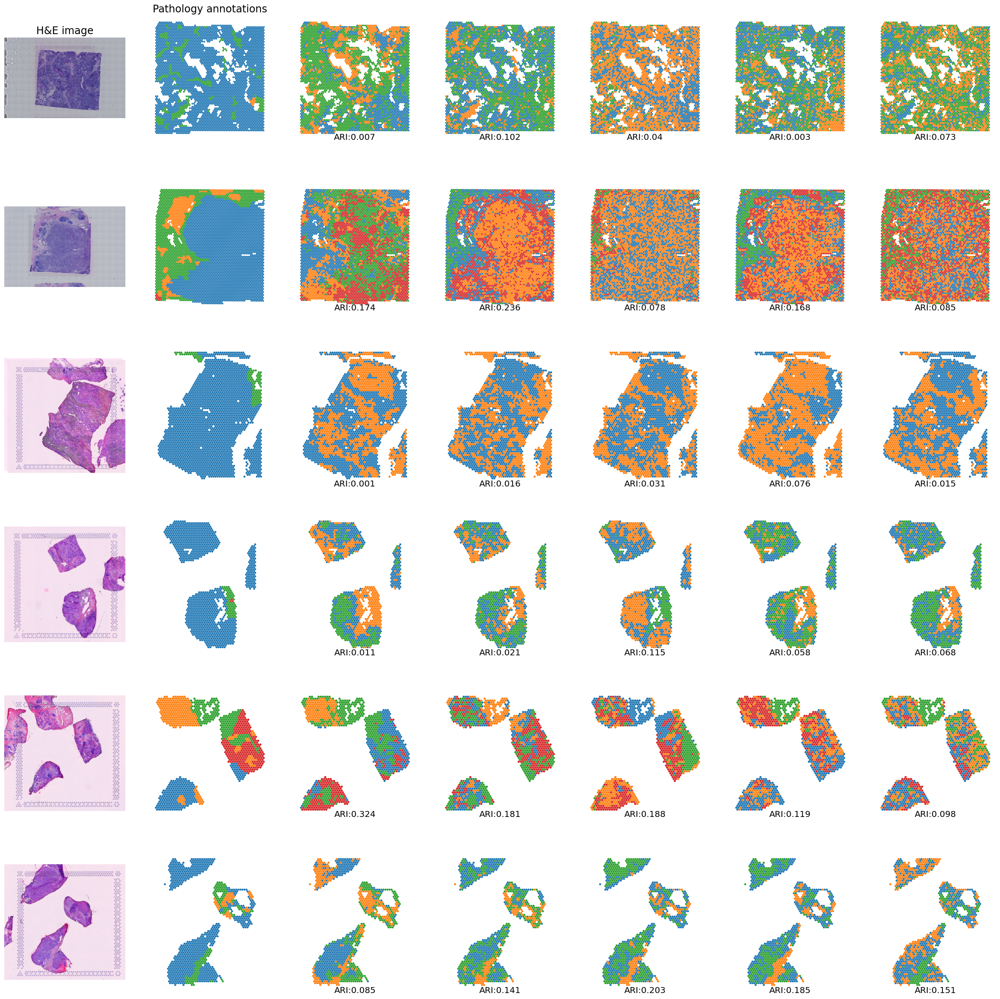

In [51]:
# Lists to collect ARI, NMI, method names, and name_slides
aris = []
nmis = []
methods = []
name_slides_list = []

# fig, axs = plt.subplots(len(name_slides), len(name_slides)+4, figsize=(30, 30))
fig, axs = plt.subplots(len(name_slides), len(name_slides)+1, figsize=(30, 30))

# Loop over folds
for fold in range(len(name_slides)):
    name = name_slides[fold]
    
    # Ground Truth (Pathology annotation)
    gt = sc.read_h5ad(f"../Results/BC_visium/gt_stimage_BC_visium_reinhard_{name}_func.h5ad")
    tmp = sc.read_h5ad(f"../Dataset/BC_visium/{name}.h5ad")
    gt.uns = tmp.uns    
    sq.pl.spatial_scatter(gt, color=None, frameon=False, title=f"H&E image",
                          legend_fontsize="x-large", ax=axs[fold][0])
    axs[fold][0].set_title(f"H&E image", fontsize="xx-large" )
    gt.obs['Grouped annotations'] = gt.obs['Grouped annotations'].cat.set_categories(['Invasive Cancer', 'Lymphocyte', 'Stroma', 'Normal'])
    
    sq.pl.spatial_scatter(gt, color="Grouped annotations", frameon=False, title=f"Pathology annotations", img=False,
                          legend_fontsize="x-large", ax=axs[fold][1], size=1.5, groups=['Invasive Cancer', 'Lymphocyte', 'Stroma', 'Normal'],)
    axs[fold][1].set_title(f"Pathology annotations", fontsize="xx-large")

    # Observation
    # print("Observation Gene Expression.")
    gt, pred_ari, pred_nmi = Space_region_detection(gt, title="Predicted Gene Expression")
    aris.append(pred_ari)
    nmis.append(pred_nmi)
    methods.append("Observation")
    name_slides_list.append(name)
    sq.pl.spatial_scatter(gt, color="cluster", frameon=False, title=f"Observed gene expression", img=False,
    # sq.pl.spatial_scatter(gt, color="cluster", frameon=False, title=f"Ground truth", img=False,
                          legend_fontsize="x-large", ax=axs[fold][2], size=1.5)
    axs[fold][2].set_title(f"ARI:{pred_ari}", fontsize="x-large", y=-0.03 )

    # Prediction
    # for i, model_name in enumerate(["stnet", "stimage", "deepspace", "hist2st", "histogene", "bleep", "deeppt"]):
    for i, model_name in enumerate([ "stimage", "deepspace", "bleep", "deeppt"]):
        pred = sc.read_h5ad(f"../Results/BC_visium/pred_{model_name}_BC_visium_reinhard_{name}_func.h5ad")
        gt = sc.read_h5ad(f"../Results/BC_visium/gt_{model_name}_BC_visium_reinhard_{name}_func.h5ad")
        tmp = sc.read_h5ad(f"../Dataset/BC_visium/{name}.h5ad")
        gt.X = pred.X
        gt.uns = tmp.uns  
        
        # Rename models for better visualization
        model_name_display = {
            "stimage": "STimage",
            "stnet": "ST-Net",
            "hist2st": "Hist2ST",
            "histogene": "HisToGene",
            "deepspace": "DeepSpaCE",
            "deeppt": "DeepPT",
            "bleep": "BLEEP"
        }.get(model_name, model_name)
        
        gt, pred_ari, pred_nmi = Space_region_detection(gt, title="Predicted Gene Expression")
        # gt, pred_ari, pred_nmi = Space_region_detection(gt, title="Ground truth")
        aris.append(pred_ari)
        nmis.append(pred_nmi)
        methods.append(model_name_display)
        name_slides_list.append(name)

        sq.pl.spatial_scatter(gt, color="cluster", title=f"{model_name_display}", img=False,
                            frameon=False, legend_fontsize="x-large", ax=axs[fold][i + 3], size=1.5)
        # axs[fold][i + 3].set_title(f"{model_name_display}", fontsize="xx-large" ,fontweight='semibold')
        axs[fold][i + 3].set_title(f"ARI:{pred_ari}", fontsize="x-large", y=-0.03 )
        
            # sq.pl.spatial_scatter(gt, color="cluster", img=False,
            #                     frameon=False, legend_fontsize="x-large", ax=axs[fold][i + 3])
    
    # for i in range(1, 10):
    # for i in range(1, 7):
    #     for j in range(6):
            # Move legend to the bottom of the plot
            # axs[j][i].legend(loc='lower center', bbox_to_anchor=(0.5, -0.12), ncol=2)
            # if i==1:
            #     axs[j][i].legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
            #     mode="expand", borderaxespad=0, ncol=4,handletextpad=0.04)
            # if i==1:
            #     axs[j][i].legend_.remove()

            # if j>=2:
                # axs[j][i].legend_.remove()
        
    # plt.savefig(f"BC_visium_clustering.pdf")
    gc.collect()


# for i in range(0, 10):
for i in range(0, 7):
    for j in range(0,6):
        # Move legend to the bottom of the plot
        if j!=0 and i <=1:
            axs[j][i].set_title('')
        #     axs[j][i].set_xlabel('asdf')
        # axs[j][i].borderaxespad
        if i>=1:
            axs[j][i].legend_.remove()

# # Create a DataFrame at the end
# result_df = pd.DataFrame({'Name_Slides': name_slides_list, 'Method': methods, 'ARI': aris, 'NMI': nmis})
# result_df.to_csv("cluster_results.csv", index=False)


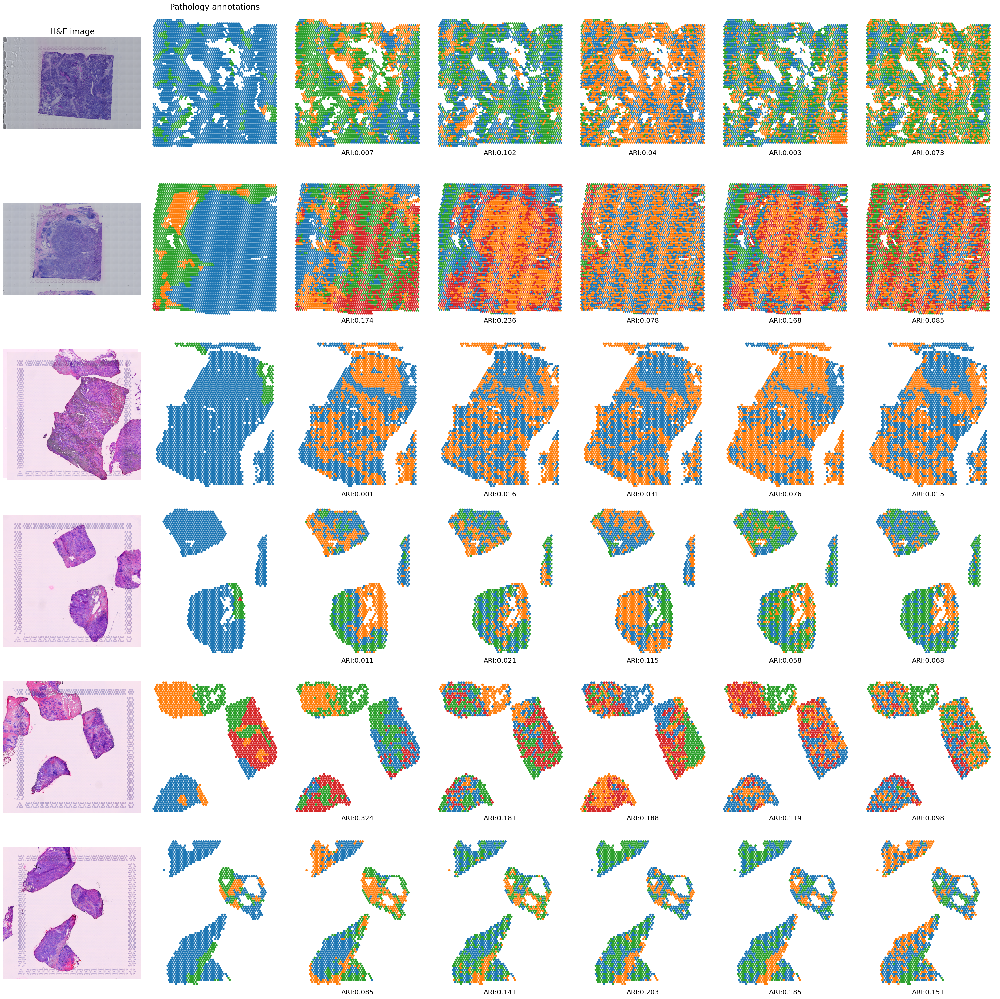

In [52]:
fig.tight_layout()
fig.savefig(transparent=True)